In [ ]:
from google.colab import drive
drive.mount('/content/drive')
# %cd /content/drive/MyDrive

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
/content/drive/MyDrive


# Clone github

In [ ]:
!git clone https://github.com/DolevDahan/I-m-Something-of-a-Painter-Myself.git

# Download and extract Datasets

Connect to kaggle API

In [ ]:
!pip install -q kaggle
token_path = "/content/kaggle.json"
!mkdir -p ~/.kaggle
!cp {token_path} ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json
!kaggle competitions download -c gan-getting-started -p ./gan-data

gan-getting-started.zip: Skipping, found more recently modified local copy (use --force to force download)


Rearrange Datasets paths (necessary)

In [ ]:
import zipfile, os, shutil

base = "./I-m-Something-of-a-Painter-Myselff/data"
trainA_outer = os.path.join(base, "trainA")
trainA_inner = os.path.join(trainA_outer, "trainA")
trainB_outer = os.path.join(base, "trainB")
trainB_inner = os.path.join(trainB_outer, "trainB")
testA = os.path.join(base, "testA")
testB = os.path.join(base, "testB")

for p in [trainA_outer, trainA_inner, trainB_outer, trainB_inner, testA, testB]:
    os.makedirs(p, exist_ok=True)

monet, photo = 0, 0
with zipfile.ZipFile("./gan-data/gan-getting-started.zip", 'r') as z:
    for m in z.namelist():
        f = os.path.basename(m)
        if not f.lower().endswith(".jpg"): continue

        if m.startswith("monet_jpg/"):
            for dest in [trainA_outer, trainA_inner]:
                with z.open(m) as src, open(os.path.join(dest, f), "wb") as dst:
                    shutil.copyfileobj(src, dst)
            monet += 1

        elif m.startswith("photo_jpg/"):
            for dest in [trainB_outer, trainB_inner]:
                with z.open(m) as src, open(os.path.join(dest, f), "wb") as dst:
                    shutil.copyfileobj(src, dst)
            photo += 1

print(f"Saved {monet} Monet images to: {trainA_outer} and {trainA_inner}")
print(f"Saved {photo} Photo images to: {trainB_outer} and {trainB_inner}")

shutil.copytree(trainB_inner, testB, dirs_exist_ok=True)
img = next(f for f in os.listdir(trainA_inner) if f.lower().endswith((".jpg", ".jpeg", ".png")))
shutil.copy2(os.path.join(trainA_inner, img), os.path.join(testA, img))
print(f"Copied {img} to {testA}")


Saved 300 Monet images to: ./I-m-Something-of-a-Painter-Myself/data/trainA and ./I-m-Something-of-a-Painter-Myself/data/trainA/trainA
Saved 7038 Photo images to: ./I-m-Something-of-a-Painter-Myself/data/trainB and ./I-m-Something-of-a-Painter-Myself/data/trainB/trainB
Copied 000c1e3bff.jpg to ./I-m-Something-of-a-Painter-Myself/data/testA


#Data Description

In [ ]:
import sys
from pathlib import Path
import os

PROJECT_DIR = Path("./I-m-Something-of-a-Painter-Myself/code/model_1").resolve()

if PROJECT_DIR not in sys.path:
    sys.path.insert(0, str(PROJECT_DIR))
from data_description import show_images,get_image_paths,compute_avg_rgb_histogram,plot_histograms


## Sample Images

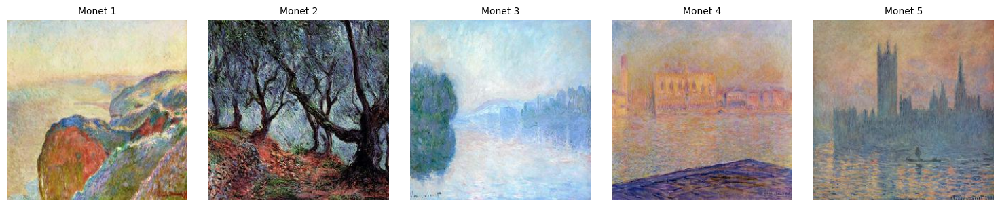

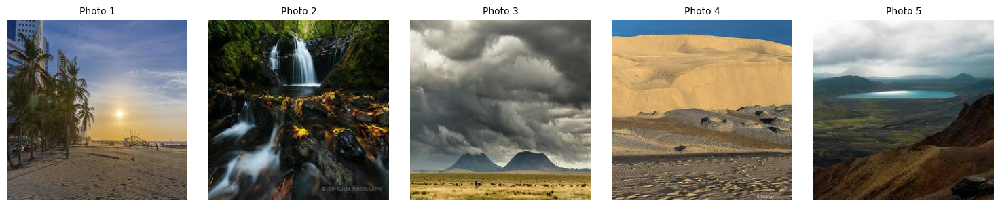

In [ ]:
path_monet = r"/content/drive/MyDrive/I-m-Something-of-a-Painter-Myself/data/trainA/trainA"
path_photo = r"/content/drive/MyDrive/I-m-Something-of-a-Painter-Myself/data/trainB/trainB"

monet_files = [os.path.join(path_monet, f) for f in os.listdir(path_monet) if f.endswith(('.jpg', '.png'))]
photo_files = [os.path.join(path_photo, f) for f in os.listdir(path_photo) if f.endswith(('.jpg', '.png'))]
show_images(monet_files, "Monet")
show_images(photo_files, "Photo")

#Model 1: CycleGAN baseline

In [ ]:
import sys
from pathlib import Path
import os

PROJECT_DIR = Path("./I-m-Something-of-a-Painter-Myself/code/model_1").resolve()

if PROJECT_DIR not in sys.path:
    sys.path.insert(0, str(PROJECT_DIR))

from training_vanilla_model import train_cycle_gan
from visualize_images import visualize_histograms
from plot_mean_variance import plot_mean_variance
from help_function import load_history, plot_losses, plot_seeds_two_figures
from load_model import load_models
from generate_images_v2 import generate_images
from MiFID import load_mifid_from_json
from show_photos_and_generated_vertical import show_photos_and_generated_vertical


## Data Preprocessing

### Normalization
We apply normalization to each image pixel — converting uint8 values in the range [0,255] to the range [−1,1], which matches the output range of the tanh activation function used in the generator network.

The normalized pixel value is computed as:


<p align="left">
$$
\text{pixel}_{\text{norm}} = \frac{2 \cdot \text{pixel}}{255} - 1
$$
</p>

Monet Histograms

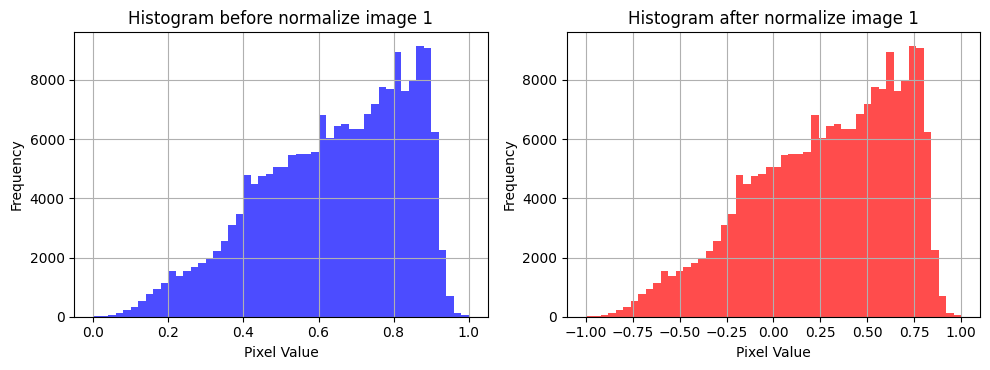

In [ ]:
path = r"./I-m-Something-of-a-Painter-Myself/data/trainA/trainA"

visualize_histograms(path, num_images=1)

Photo Histograms

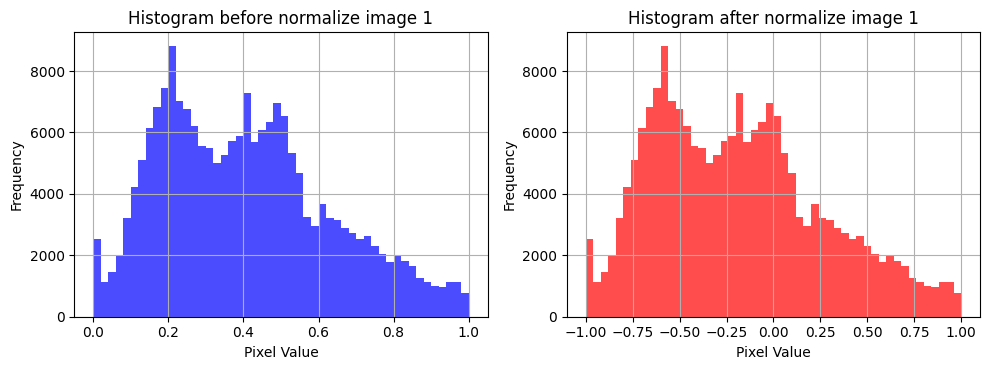

In [ ]:
path = r"./I-m-Something-of-a-Painter-Myself/data/trainB/trainB"

visualize_histograms(path, num_images=1)

##Training model

In [ ]:
checkpoints_dir = "./I-m-Something-of-a-Painter-Myself/checkpoints/model_1"
os.makedirs(checkpoints_dir, exist_ok=True)

save_dir = os.path.join(checkpoints_dir, "Checkpoints_100")
os.makedirs(save_dir, exist_ok=True)
train_cycle_gan(seed=42,
                path_monet='./I-m-Something-of-a-Painter-Myself/data/trainA',
                path_photo='./I-m-Something-of-a-Painter-Myself/data/trainB',
                save_dir=save_dir,
                batch_size=5,
                n_epochs=100)


Training for seed: 42
Total Monet images: 300
Total Photo images: 7038
Monet images in training subset: 200
Photo images in training subset: 200
[Epoch 1/100]
G: 3.8436 (GAN: 0.3583, Cycle: 0.2464, Identity: 0.2253)
D: 0.2306 (D_A: 0.2353, D_B: 0.2259)
[Epoch 2/100]
G: 4.0826 (GAN: 0.4793, Cycle: 0.2493, Identity: 0.2357)
D: 0.3300 (D_A: 0.3212, D_B: 0.3389)
[Epoch 3/100]
G: 5.0226 (GAN: 0.4673, Cycle: 0.3376, Identity: 0.2867)
D: 0.2305 (D_A: 0.1968, D_B: 0.2641)
[Epoch 4/100]
G: 4.5958 (GAN: 0.3566, Cycle: 0.3020, Identity: 0.2729)
D: 0.2575 (D_A: 0.3093, D_B: 0.2057)
[Epoch 5/100]
G: 3.5407 (GAN: 0.5399, Cycle: 0.2139, Identity: 0.1931)
D: 0.1744 (D_A: 0.1623, D_B: 0.1864)
[Epoch 6/100]
G: 4.2029 (GAN: 0.4015, Cycle: 0.2780, Identity: 0.2411)
D: 0.1897 (D_A: 0.2109, D_B: 0.1685)
[Epoch 7/100]
G: 4.5636 (GAN: 0.3694, Cycle: 0.3380, Identity: 0.2504)
D: 0.1969 (D_A: 0.1781, D_B: 0.2158)
[Epoch 8/100]
G: 3.8409 (GAN: 0.8075, Cycle: 0.2293, Identity: 0.1887)
D: 0.2008 (D_A: 0.2453, D_B:

{'seed': 42,
 'G_losses': [3.8435559272766113,
  4.082649230957031,
  5.022627830505371,
  4.5957746505737305,
  3.540740489959717,
  4.202877998352051,
  4.563554763793945,
  3.8409438133239746,
  4.117941856384277,
  3.391443967819214,
  3.4456355571746826,
  3.6360785961151123,
  3.2939817905426025,
  4.1942973136901855,
  3.47155499458313,
  3.0037355422973633,
  3.7194297313690186,
  3.038770914077759,
  3.316220760345459,
  3.4507994651794434,
  3.658766746520996,
  3.052394390106201,
  3.5136897563934326,
  4.483217239379883,
  2.8511173725128174,
  2.9858717918395996,
  2.6432137489318848,
  2.939889669418335,
  2.8338685035705566,
  2.5374293327331543,
  3.4715170860290527,
  2.772324323654175,
  3.0394959449768066,
  3.04181170463562,
  2.972724676132202,
  2.5610783100128174,
  2.5322446823120117,
  2.7819361686706543,
  2.531445264816284,
  2.5747580528259277,
  2.6262850761413574,
  2.8003227710723877,
  2.4892120361328125,
  2.8451547622680664,
  2.723090887069702,
  2.68

In [ ]:
train_cycle_gan(seed=123,
                path_monet='./I-m-Something-of-a-Painter-Myself/data/trainA',
                path_photo='./I-m-Something-of-a-Painter-Myself/data/trainB',
                save_dir=save_dir,
                batch_size=5,
                n_epochs=100)


Training for seed: 123
Total Monet images: 300
Total Photo images: 7038
Monet images in training subset: 200
Photo images in training subset: 200
[Epoch 1/100]
G: 5.1808 (GAN: 0.3058, Cycle: 0.3363, Identity: 0.3194)
D: 0.2594 (D_A: 0.2329, D_B: 0.2858)
[Epoch 2/100]
G: 4.7984 (GAN: 0.4050, Cycle: 0.3073, Identity: 0.2857)
D: 0.2003 (D_A: 0.1951, D_B: 0.2055)
[Epoch 3/100]
G: 3.9262 (GAN: 0.4050, Cycle: 0.2497, Identity: 0.2273)
D: 0.2575 (D_A: 0.2664, D_B: 0.2487)
[Epoch 4/100]
G: 3.6061 (GAN: 0.3197, Cycle: 0.2348, Identity: 0.2112)
D: 0.2107 (D_A: 0.2322, D_B: 0.1893)
[Epoch 5/100]
G: 3.9931 (GAN: 0.3525, Cycle: 0.2526, Identity: 0.2377)
D: 0.2278 (D_A: 0.2583, D_B: 0.1973)
[Epoch 6/100]
G: 4.0196 (GAN: 0.3832, Cycle: 0.2818, Identity: 0.2227)
D: 0.1761 (D_A: 0.2009, D_B: 0.1512)
[Epoch 7/100]
G: 3.3477 (GAN: 0.5427, Cycle: 0.1981, Identity: 0.1815)
D: 0.1948 (D_A: 0.2009, D_B: 0.1887)
[Epoch 8/100]
G: 3.7941 (GAN: 0.3739, Cycle: 0.2516, Identity: 0.2162)
D: 0.2613 (D_A: 0.2701, D_B

{'seed': 123,
 'G_losses': [5.180825233459473,
  4.798398494720459,
  3.9262280464172363,
  3.6061253547668457,
  3.993135690689087,
  4.019595146179199,
  3.347749710083008,
  3.794118881225586,
  4.14328145980835,
  4.031902313232422,
  4.194931507110596,
  2.9850049018859863,
  3.2878360748291016,
  3.904526710510254,
  2.9332799911499023,
  3.2609987258911133,
  3.1502933502197266,
  3.3416271209716797,
  3.54727840423584,
  2.6952643394470215,
  2.949197292327881,
  3.1192517280578613,
  3.067206621170044,
  3.1726016998291016,
  3.609151840209961,
  2.606776714324951,
  3.381166934967041,
  3.4690639972686768,
  3.236196517944336,
  3.331368923187256,
  3.0324833393096924,
  3.1642398834228516,
  2.887033224105835,
  2.822615146636963,
  2.7706265449523926,
  2.8192224502563477,
  3.0006680488586426,
  3.3007678985595703,
  2.5798792839050293,
  2.333240509033203,
  2.2873544692993164,
  2.944746494293213,
  2.956958770751953,
  2.4367666244506836,
  2.5009121894836426,
  8.30167

In [ ]:
train_cycle_gan(seed=2025,
                path_monet='./I-m-Something-of-a-Painter-Myself/data/trainA',
                path_photo='./I-m-Something-of-a-Painter-Myself/data/trainB',
                save_dir=save_dir,
                batch_size=5,
                n_epochs=100)

Training for seed: 2025
Total Monet images: 300
Total Photo images: 7038
Monet images in training subset: 200
Photo images in training subset: 200
[Epoch 1/100]
G: 5.0296 (GAN: 0.3223, Cycle: 0.3174, Identity: 0.3120)
D: 0.2603 (D_A: 0.2499, D_B: 0.2707)
[Epoch 2/100]
G: 3.9010 (GAN: 0.3783, Cycle: 0.2580, Identity: 0.2232)
D: 0.2630 (D_A: 0.2763, D_B: 0.2496)
[Epoch 3/100]
G: 4.3724 (GAN: 0.3993, Cycle: 0.2800, Identity: 0.2573)
D: 0.2275 (D_A: 0.2989, D_B: 0.1560)
[Epoch 4/100]
G: 3.9536 (GAN: 0.3734, Cycle: 0.2705, Identity: 0.2228)
D: 0.1986 (D_A: 0.1942, D_B: 0.2030)
[Epoch 5/100]
G: 3.5887 (GAN: 0.4495, Cycle: 0.2325, Identity: 0.1977)
D: 0.1433 (D_A: 0.1435, D_B: 0.1431)
[Epoch 6/100]
G: 3.9488 (GAN: 0.3947, Cycle: 0.2614, Identity: 0.2247)
D: 0.2146 (D_A: 0.2234, D_B: 0.2057)
[Epoch 7/100]
G: 3.9171 (GAN: 0.3699, Cycle: 0.2607, Identity: 0.2244)
D: 0.3083 (D_A: 0.3172, D_B: 0.2995)
[Epoch 8/100]
G: 3.8252 (GAN: 0.3980, Cycle: 0.2397, Identity: 0.2229)
D: 0.1647 (D_A: 0.1709, D_

{'seed': 2025,
 'G_losses': [5.029574871063232,
  3.901010513305664,
  4.372440338134766,
  3.953610897064209,
  3.5886950492858887,
  3.9488000869750977,
  3.917118549346924,
  3.8251614570617676,
  4.08878755569458,
  3.6392221450805664,
  2.9532947540283203,
  4.259511947631836,
  3.7137045860290527,
  3.5656931400299072,
  3.5697851181030273,
  4.07066535949707,
  3.828096389770508,
  3.1875717639923096,
  3.555952787399292,
  3.0915884971618652,
  3.5235824584960938,
  2.838244915008545,
  3.587904691696167,
  3.5672566890716553,
  2.9567837715148926,
  3.1747031211853027,
  3.168735980987549,
  3.0694549083709717,
  2.6984610557556152,
  2.4299802780151367,
  2.5912673473358154,
  2.9375064373016357,
  2.6609928607940674,
  2.5414600372314453,
  2.4550700187683105,
  2.7846295833587646,
  2.368412971496582,
  2.861203670501709,
  2.6113433837890625,
  2.607001304626465,
  2.8963868618011475,
  2.840761184692383,
  2.628329277038574,
  2.9362990856170654,
  3.318446636199951,
  2.

## Results

### Training Loss Convergence

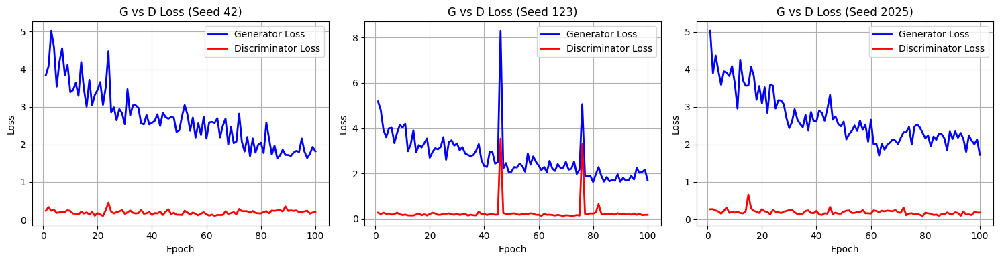

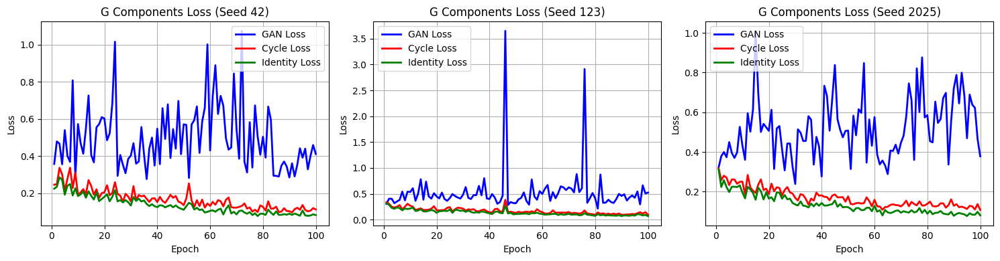

In [ ]:
seed = 42
json_path = f"./I-m-Something-of-a-Painter-Myself/checkpoints/model_1/Checkpoints_100/history_seed_{seed}.json"
history_42 = load_history(json_path)

seed = 123
json_path_123 = f"./I-m-Something-of-a-Painter-Myself/checkpoints/model_1/Checkpoints_100/history_seed_{seed}.json"
history_123 = load_history(json_path_123)

seed = 2025
json_path_2025 = f"./I-m-Something-of-a-Painter-Myself/checkpoints/model_1/Checkpoints_100/history_seed_{seed}.json"
history_2025 = load_history(json_path_2025)

histories={"42":history_42, "123":history_123, "2025":history_2025}
plot_seeds_two_figures(histories)

### Generated Images and Present Test Resluts

#### Generate Images

In [ ]:
models_42 = load_models(r"./I-m-Something-of-a-Painter-Myself/checkpoints/model_1/Checkpoints_100/checkpoint_seed_42.pth")
G_BA_42 = models_42["G_BA"]

models_123 = load_models(r"./I-m-Something-of-a-Painter-Myself/checkpoints/model_1/Checkpoints_100/checkpoint_seed_123.pth")
G_BA_123 = models_123["G_BA"]

models_2025 = load_models(r"./I-m-Something-of-a-Painter-Myself/checkpoints/model_1/Checkpoints_100/checkpoint_seed_2025.pth")
G_BA_2025 = models_2025["G_BA"]

In [ ]:
generate_images(
    G_BA_42,
    input_dir=r"./I-m-Something-of-a-Painter-Myself/data/trainB/trainB",
    output_dir="./I-m-Something-of-a-Painter-Myself/output/generated_images_vanilla_model_seed_42",
)

In [ ]:
generate_images(
    G_BA_123,
    input_dir=r"./I-m-Something-of-a-Painter-Myself/data/trainB/trainB",
    output_dir="./I-m-Something-of-a-Painter-Myself/output/generated_images_vanilla_model_seed_123",
)

In [ ]:
generate_images(
    G_BA_2025,
    input_dir=r"./I-m-Something-of-a-Painter-Myself/data/trainB/trainB",
    output_dir="./I-m-Something-of-a-Painter-Myself/output/generated_images_vanilla_model_seed_2025",
)

#### Test Resluts



##### Quantitative Metric- MiFID  

Kaggle contest instructions: "A demo of our MiFID evaluation code can be seen [here](https://www.kaggle.com/code/wendykan/demo-mifid-metric-for-dog-image-generation-comp).

In [ ]:
from evaluation.evaluation import calculate_kid_given_paths, distance_thresholding, model_params

In [ ]:
user_images_path = r'./I-m-Something-of-a-Painter-Myself/output/generated_images_vanilla_model_seed_42'
real_images_path = r'./I-m-Something-of-a-Painter-Myself/monet_test_jpg'

images_path = [user_images_path, real_images_path]

public_path=r"./I-m-Something-of-a-Painter-Myself/code/model_1/evaluation/classify_image_graph_def.pb"

fid_epsilon = 10e-15

fid_value_public_42, distance_public_42_true = calculate_kid_given_paths(images_path, 'Inception', public_path)
distance_public_42 = distance_thresholding(distance_public_42_true, model_params['Inception']['cosine_distance_eps'])
print("FID_public: ", fid_value_public_42, "distance_public_42: ", distance_public_42, "multiplied_public: ", fid_value_public_42 /(distance_public_42 + fid_epsilon))

Instructions for updating:
Use tf.gfile.GFile.
100%|██████████| 893/893 [00:16<00:00, 53.67it/s]


m1,m2 shape= ((2048,), (2048,)) s1,s2= ((2048, 2048), (2048, 2048))
starting calculating FID
covmean.shape= (2048, 2048)
done with FID, starting distance calculation
d.shape= (7038, 893)
np.min(d, axis=1).shape= (7038,)
distance= 0.2608378944806101
FID_public:  96.0212363693916 distance_public_42:  1 multiplied_public:  96.02123636939064


In [ ]:
user_images_path = r'./I-m-Something-of-a-Painter-Myself/output/generated_images_vanilla_model_seed_123'
real_images_path = r'./I-m-Something-of-a-Painter-Myself/monet_test_jpg'

images_path = [user_images_path, real_images_path]

public_path=r"./I-m-Something-of-a-Painter-Myself/code/model_1/evaluation/classify_image_graph_def.pb"

fid_epsilon = 10e-15

fid_value_public_123, distance_public_123_true = calculate_kid_given_paths(images_path, 'Inception', public_path)
distance_public_123 = distance_thresholding(distance_public_123_true, model_params['Inception']['cosine_distance_eps'])
print("FID_public: ", fid_value_public_123, "distance_public_123: ", distance_public_123, "multiplied_public: ", fid_value_public_123 /(distance_public_123 + fid_epsilon))

100%|██████████| 893/893 [00:16<00:00, 54.86it/s]


m1,m2 shape= ((2048,), (2048,)) s1,s2= ((2048, 2048), (2048, 2048))
starting calculating FID
covmean.shape= (2048, 2048)
done with FID, starting distance calculation
d.shape= (7038, 893)
np.min(d, axis=1).shape= (7038,)
distance= 0.2604556875495819
FID_public:  87.55467781045536 distance_public_123:  1 multiplied_public:  87.55467781045448


In [ ]:
user_images_path = r'./I-m-Something-of-a-Painter-Myself/output/generated_images_vanilla_model_seed_2025'
real_images_path = r'./I-m-Something-of-a-Painter-Myself/monet_test_jpg'

images_path = [user_images_path, real_images_path]

public_path=r"./I-m-Something-of-a-Painter-Myself/code/model_1/evaluation/classify_image_graph_def.pb"

fid_epsilon = 10e-15

fid_value_public_2025, distance_public_2025_true = calculate_kid_given_paths(images_path, 'Inception', public_path)
distance_public_2025 = distance_thresholding(distance_public_2025_true, model_params['Inception']['cosine_distance_eps'])
print("FID_public: ", fid_value_public_2025, "distance_public_2025: ", distance_public_2025, "multiplied_public: ", fid_value_public_2025 /(distance_public_2025 + fid_epsilon))

100%|██████████| 893/893 [00:16<00:00, 54.55it/s]


m1,m2 shape= ((2048,), (2048,)) s1,s2= ((2048, 2048), (2048, 2048))
starting calculating FID
covmean.shape= (2048, 2048)
done with FID, starting distance calculation
d.shape= (7038, 893)
np.min(d, axis=1).shape= (7038,)
distance= 0.25543221092155105
FID_public:  91.00924904407486 distance_public_2025:  1 multiplied_public:  91.00924904407395


In [ ]:
import pandas as pd
import json
from IPython.display import display

data = {
    "FID": {
        "Seed 42": fid_value_public_42,
        "Seed 123": fid_value_public_123,
        "Seed 2025": fid_value_public_2025
    },
    "Distance": {
        "Seed 42": distance_public_42_true,
        "Seed 123": distance_public_123_true,
        "Seed 2025": distance_public_2025_true
    },
    "Distance after threshold": {
        "Seed 42": distance_public_42,
        "Seed 123": distance_public_123,
        "Seed 2025": distance_public_2025
    }
}

df = pd.DataFrame(data)
mean_row = pd.DataFrame(df.mean(numeric_only=True)).T
mean_row.index = ["Mean"]

std_row = pd.DataFrame(df.std(numeric_only=True)).T
std_row.index = ["Std"]

df_full = pd.concat([df, mean_row, std_row])


df_full = df_full.round(4)


display(df_full)


json_data = df_full.reset_index().rename(columns={"index": "Seed"}).to_dict(orient="records")
with open("fid_distance_results_model_1.json", "w") as f:
    json.dump(json_data, f, indent=4)

print("Saved results to: fid_distance_results_model_1.json")


,FID,Distance,Distance after threshold
Seed 42,96.0212,0.2608,1.0
Seed 123,87.5547,0.2605,1.0
Seed 2025,91.0092,0.2554,1.0
Mean,91.5284,0.2589,1.0
Std,4.2571,0.0030,0.0


Saved results to: fid_distance_results_model_1.json


#####  Qualitative Examples

###### Positive performance

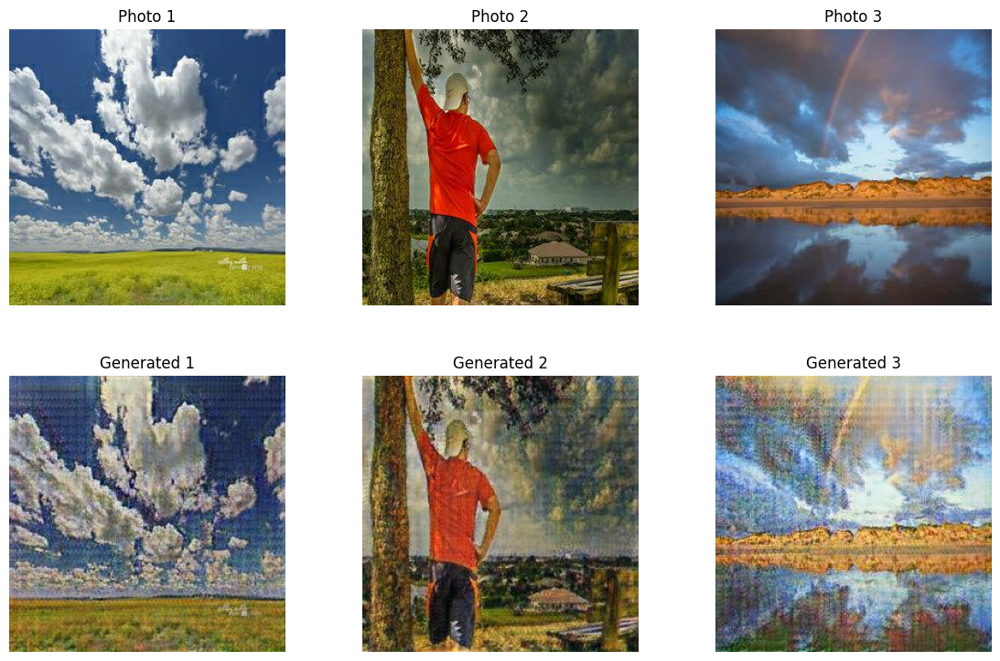

In [ ]:
filenames = [
    '0bede4ba4e.jpg',
    '4ae0b6efb2.jpg',
    '0a7a8e30bd.jpg'
]

# 0b2454f0e3
# 0c21bed0d8

photo_dir= './I-m-Something-of-a-Painter-Myself/data/trainB/trainB'
generated_dir='./I-m-Something-of-a-Painter-Myself/output/generated_images_vanilla_model_seed_42'

show_photos_and_generated_vertical(photo_dir, generated_dir, filenames)


###### Negative performance

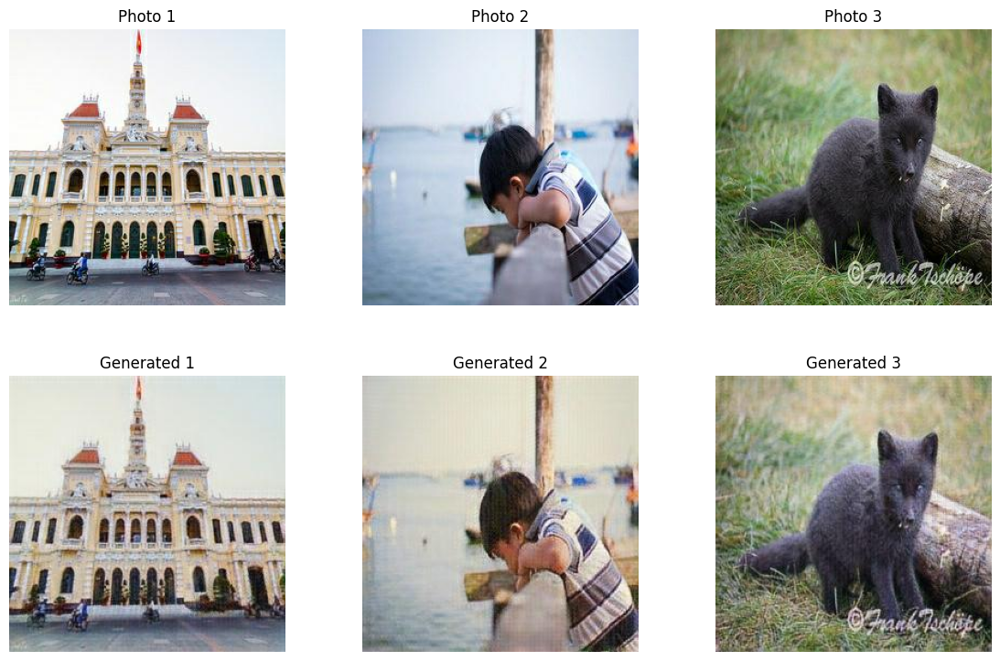

In [ ]:
filenames = [
    '5f4018d615.jpg',
    '7d33e5e3ac.jpg',
    '5c3afc56ce.jpg'
]
photo_dir= './I-m-Something-of-a-Painter-Myself/data/trainB/trainB'
generated_dir='./I-m-Something-of-a-Painter-Myself/output/generated_images_vanilla_model_seed_42'

show_photos_and_generated_vertical(photo_dir, generated_dir, filenames)

# Model 2: CUT-inspired

In [ ]:
import sys, torch, time
from argparse import Namespace
from pathlib import Path
from math import inf
import random, numpy as np
import os

PROJECT_DIR = Path("./I-m-Something-of-a-Painter-Myself/code/model_2").resolve()

if PROJECT_DIR not in sys.path:
    sys.path.insert(0, str(PROJECT_DIR))

from train import train
from test import load_trained_generator
from dataset import plot_seeds_two_figures,load_history
from evaluation import *
from compare_images import show_comparison, show_random_comparison

##Data Preprocessing

### Normalization
We apply normalization to each image pixel — converting uint8 values in the range [0,255] to the range [−1,1], which matches the output range of the tanh activation function used in the generator network.

The normalized pixel value is computed as:


<p align="left">
$$
\text{pixel}_{\text{norm}} = \frac{2 \cdot \text{pixel}}{255} - 1
$$
</p>

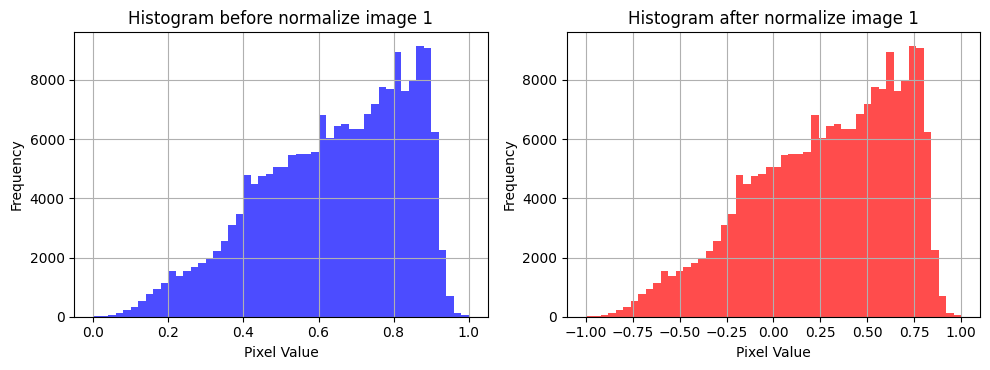

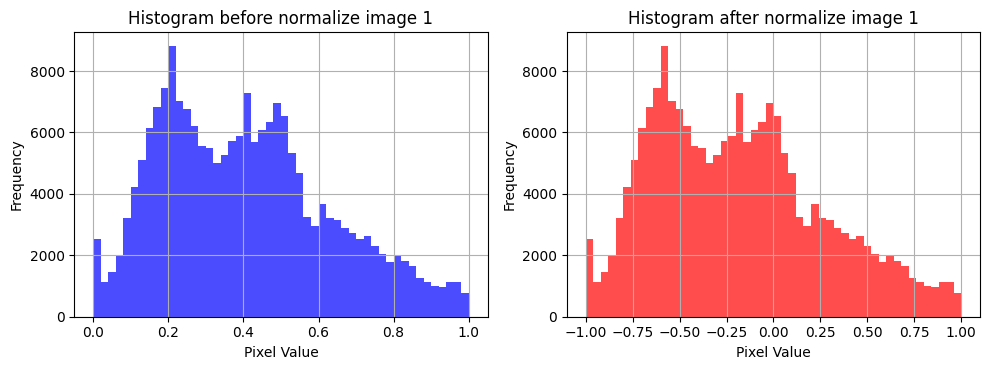

In [ ]:
path = r"./I-m-Something-of-a-Painter-Myself/data/trainA/trainA"

visualize_histograms(path, num_images=1)

path = r"./I-m-Something-of-a-Painter-Myself/data/trainB/trainB"

visualize_histograms(path, num_images=1)

## Training model


In [ ]:
TrainOpt = Namespace(
    name='',
    seed=42,
    dataroot='./I-m-Something-of-a-Painter-Myself/data',
    checkpoints_dir='./I-m-Something-of-a-Painter-Myself/checkpoints/model_2/Checkpoints_100/',


    batch_size=4,
    num_threads=4,
    max_dataset_size=float('inf'),
    train_samples=200,
    serial_batches=False,

    isTrain=True,
    phase='train',
    direction='BtoA',

    input_nc=3,
    output_nc=3,

    n_epochs=70,
    n_epochs_decay=30,
    epoch_count=1,
    lr=0.0002,
    lr_policy='linear',
    beta1=0.5,
    beta2=0.999,

    netG='resnet_15blocks',
    netD='basic',
    netF='mlp_sample',
    ngf=64,
    ndf=64,
    n_layers_D=3,
    netF_nc=256,
    init_gain=0.02,
    init_type='xavier',

    normG='instance',
    normD='instance',
    no_dropout=True,
    no_antialias=False,
    no_antialias_up=False,

    gan_mode='lsgan',
    lambda_GAN=1.0,
    lambda_NCE=1.0,
    nce_T=0.07,
    nce_layers='0,4,8,12,16',
    nce_idt=True,
    nce_includes_all_negatives_from_minibatch=False,
    num_patches = 256,
    gpu_ids=[0],

    save_epoch_freq=20,
    save_latest_freq=5000,
    save_by_iter=False,
    print_freq=100,
    verbose=False,

    preprocess = 'none',
    no_flip = False,
    flip_equivariance = False,
    continue_train = False
)


In [ ]:
TrainOpt.name = 'Model2_Train_seed42'
TrainOpt.seed = 42
train(TrainOpt)

dataset [UnalignedDataset] was created
The number of training images = 200
model [MinimalCUTModel] was created
----OPT----
{'batch_size': 4,
 'beta1': 0.5,
 'beta2': 0.999,
 'checkpoints_dir': './I-m-Something-of-a-Painter-Myself/checkpoints',
 'continue_train': False,
 'dataroot': './I-m-Something-of-a-Painter-Myself/data',
 'direction': 'BtoA',
 'epoch_count': 1,
 'flip_equivariance': False,
 'gan_mode': 'lsgan',
 'gpu_ids': [0],
 'init_gain': 0.02,
 'init_type': 'xavier',
 'input_nc': 3,
 'isTrain': True,
 'lambda_GAN': 1.0,
 'lambda_NCE': 1.0,
 'lr': 0.0002,
 'lr_policy': 'linear',
 'max_dataset_size': inf,
 'n_epochs': 70,
 'n_epochs_decay': 30,
 'n_layers_D': 3,
 'name': 'Model2_Train_seed42',
 'nce_T': 0.07,
 'nce_idt': True,
 'nce_includes_all_negatives_from_minibatch': False,
 'nce_layers': '0,4,8,12,16',
 'ndf': 64,
 'netD': 'basic',
 'netF': 'mlp_sample',
 'netF_nc': 256,
 'netG': 'resnet_15blocks',
 'ngf': 64,
 'no_antialias': False,
 'no_antialias_up': False,
 'no_dropout'

/content/I-m-Something-of-a-Painter-Myself/code/model_2/networks.py:520: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  patch_id = torch.tensor(patch_id, dtype=torch.long, device=feat.device)


---------- Networks initialized -------------
[Network G] Total number of parameters : 18.459 M
[Network F] Total number of parameters : 0.560 M
[Network D] Total number of parameters : 2.765 M
-----------------------------------------------
Epoch 001: D=0.281  G=5.251  GAN=0.325  NCE=4.926
learning rate = 0.0002000
[Epoch 001] time=12.4s
Epoch 002: D=0.264  G=4.610  GAN=0.307  NCE=4.304
learning rate = 0.0002000
[Epoch 002] time=12.0s
Epoch 003: D=0.239  G=4.090  GAN=0.306  NCE=3.783
learning rate = 0.0002000
[Epoch 003] time=12.0s
Epoch 004: D=0.262  G=3.909  GAN=0.300  NCE=3.608
learning rate = 0.0002000
[Epoch 004] time=12.0s
Epoch 005: D=0.231  G=3.793  GAN=0.314  NCE=3.479
learning rate = 0.0002000
[Epoch 005] time=12.0s
Epoch 006: D=0.231  G=3.460  GAN=0.362  NCE=3.098
learning rate = 0.0002000
[Epoch 006] time=12.0s
Epoch 007: D=0.238  G=3.251  GAN=0.339  NCE=2.911
learning rate = 0.0002000
[Epoch 007] time=12.0s
Epoch 008: D=0.253  G=3.090  GAN=0.356  NCE=2.733
learning rate =

In [ ]:
TrainOpt.name = 'Model2_Train_seed123'
TrainOpt.seed = 123
train(TrainOpt)

dataset [UnalignedDataset] was created
The number of training images = 200
model [MinimalCUTModel] was created
----OPT----
{'batch_size': 4,
 'beta1': 0.5,
 'beta2': 0.999,
 'checkpoints_dir': './I-m-Something-of-a-Painter-Myself/checkpoints',
 'continue_train': False,
 'dataroot': './I-m-Something-of-a-Painter-Myself/data',
 'dataset_mode': 'unaligned',
 'direction': 'BtoA',
 'epoch': 'latest',
 'epoch_count': 1,
 'evaluation_freq': 5000,
 'flip_equivariance': False,
 'gan_mode': 'lsgan',
 'gpu_ids': [0],
 'init_gain': 0.02,
 'init_type': 'xavier',
 'input_nc': 3,
 'isTrain': True,
 'lambda_GAN': 1.0,
 'lambda_NCE': 1.0,
 'load_size': 286,
 'lr': 0.0002,
 'lr_policy': 'linear',
 'max_dataset_size': inf,
 'n_epochs': 70,
 'n_epochs_decay': 30,
 'n_layers_D': 3,
 'name': 'Model2_Train_seed123',
 'nce_T': 0.07,
 'nce_idt': True,
 'nce_includes_all_negatives_from_minibatch': False,
 'nce_layers': '0,4,8,12,16',
 'ndf': 64,
 'netD': 'basic',
 'netF': 'mlp_sample',
 'netF_nc': 256,
 'netG':

/content/drive/MyDrive/I-m-Something-of-a-Painter-Myself/code/model_2/networks.py:520: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  patch_id = torch.tensor(patch_id, dtype=torch.long, device=feat.device)


---------- Networks initialized -------------
[Network G] Total number of parameters : 18.459 M
[Network F] Total number of parameters : 0.560 M
[Network D] Total number of parameters : 2.765 M
-----------------------------------------------
Epoch 001: D=0.277  G=5.384  GAN=0.325  NCE=5.059
learning rate = 0.0002000
[Epoch 001] time=21.7s
Epoch 002: D=0.260  G=4.914  GAN=0.284  NCE=4.630
learning rate = 0.0002000
[Epoch 002] time=12.1s
Epoch 003: D=0.257  G=4.569  GAN=0.294  NCE=4.275
learning rate = 0.0002000
[Epoch 003] time=12.1s
Epoch 004: D=0.255  G=4.080  GAN=0.290  NCE=3.790
learning rate = 0.0002000
[Epoch 004] time=12.1s
Epoch 005: D=0.258  G=3.990  GAN=0.282  NCE=3.708
learning rate = 0.0002000
[Epoch 005] time=12.1s
Epoch 006: D=0.256  G=3.729  GAN=0.299  NCE=3.430
learning rate = 0.0002000
[Epoch 006] time=12.0s
Epoch 007: D=0.269  G=3.218  GAN=0.318  NCE=2.900
learning rate = 0.0002000
[Epoch 007] time=12.1s
Epoch 008: D=0.242  G=3.075  GAN=0.308  NCE=2.767
learning rate =

In [ ]:
TrainOpt.name = 'Model2_Train_seed2025'
TrainOpt.seed = 2025
train(TrainOpt)

dataset [UnalignedDataset] was created
The number of training images = 200
model [MinimalCUTModel] was created
----OPT----
{'batch_size': 4,
 'beta1': 0.5,
 'beta2': 0.999,
 'checkpoints_dir': './I-m-Something-of-a-Painter-Myself/checkpoints',
 'continue_train': False,
 'dataroot': './I-m-Something-of-a-Painter-Myself/data',
 'dataset_mode': 'unaligned',
 'direction': 'BtoA',
 'epoch': 'latest',
 'epoch_count': 1,
 'evaluation_freq': 5000,
 'flip_equivariance': False,
 'gan_mode': 'lsgan',
 'gpu_ids': [0],
 'init_gain': 0.02,
 'init_type': 'xavier',
 'input_nc': 3,
 'isTrain': True,
 'lambda_GAN': 1.0,
 'lambda_NCE': 1.0,
 'load_size': 286,
 'lr': 0.0002,
 'lr_policy': 'linear',
 'max_dataset_size': inf,
 'n_epochs': 70,
 'n_epochs_decay': 30,
 'n_layers_D': 3,
 'name': 'Model2_Train_seed2025',
 'nce_T': 0.07,
 'nce_idt': True,
 'nce_includes_all_negatives_from_minibatch': False,
 'nce_layers': '0,4,8,12,16',
 'ndf': 64,
 'netD': 'basic',
 'netF': 'mlp_sample',
 'netF_nc': 256,
 'netG'

/content/I-m-Something-of-a-Painter-Myself/code/model_2/networks.py:520: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  patch_id = torch.tensor(patch_id, dtype=torch.long, device=feat.device)


---------- Networks initialized -------------
[Network G] Total number of parameters : 18.459 M
[Network F] Total number of parameters : 0.560 M
[Network D] Total number of parameters : 2.765 M
-----------------------------------------------
Epoch 001: D=0.283  G=5.243  GAN=0.336  NCE=4.907
learning rate = 0.0002000
[Epoch 001] time=13.7s
Epoch 002: D=0.276  G=4.511  GAN=0.308  NCE=4.203
learning rate = 0.0002000
[Epoch 002] time=12.0s
Epoch 003: D=0.259  G=4.016  GAN=0.286  NCE=3.730
learning rate = 0.0002000
[Epoch 003] time=12.0s
Epoch 004: D=0.264  G=3.535  GAN=0.310  NCE=3.225
learning rate = 0.0002000
[Epoch 004] time=12.0s
Epoch 005: D=0.256  G=3.609  GAN=0.293  NCE=3.316
learning rate = 0.0002000
[Epoch 005] time=12.0s
Epoch 006: D=0.245  G=3.090  GAN=0.294  NCE=2.796
learning rate = 0.0002000
[Epoch 006] time=12.0s
Epoch 007: D=0.243  G=2.847  GAN=0.311  NCE=2.536
learning rate = 0.0002000
[Epoch 007] time=12.0s
Epoch 008: D=0.244  G=2.754  GAN=0.333  NCE=2.421
learning rate =

## Results

### Training Loss Convergence



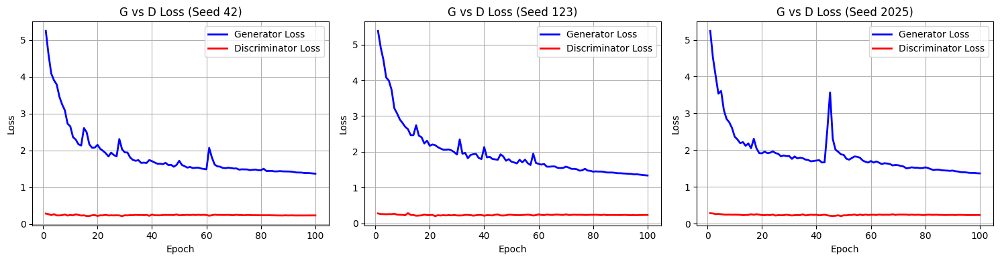

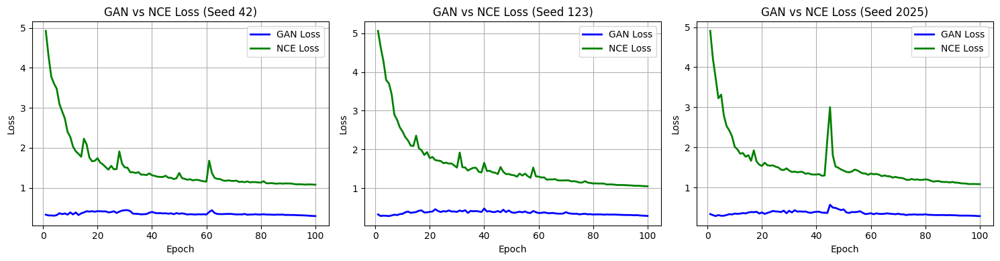

In [ ]:
seed = 42
json_path_42 = "./I-m-Something-of-a-Painter-Myself/checkpoints/model_2/Checkpoints_100/Model2_Train_seed42_hist_seed_42.json"
history_42 = load_history(json_path_42)

seed = 123
json_path_123 = "./I-m-Something-of-a-Painter-Myself/checkpoints/model_2/Checkpoints_100/Model2_Train_seed123_hist_seed_123.json"
history_123 = load_history(json_path_123)

seed = 2025
json_path_2025 = "/content/I-m-Something-of-a-Painter-Myself/checkpoints/model_2/Checkpoints_100/Model2_Train_seed2025_hist_seed_2025.json"
history_2025 = load_history(json_path_2025)

histories={"42":history_42, "123":history_123, "2025":history_2025}
plot_seeds_two_figures(histories)

### Generated Images and Present Test Resluts

#### Generate Images

In [ ]:
from argparse import Namespace

TestOpt = Namespace(
    phase="test",
    epoch="latest",
    direction="BtoA",
    num_test=7038,
    gpu_ids=[0],
    isTrain=False,
    batch_size=1,
    num_threads=0,
    serial_batches=True,
    max_dataset_size=float("inf"),
    no_flip=True,
    input_nc=3,
    output_nc=3,
    netG="resnet_15blocks",
    ngf=64,
    normG="instance",
    init_type="xavier",
    init_gain=0.02,
    no_antialias = False,
    no_antialias_up = False,
    preprocess="none",
    verbose=False,

    nce_idt=True,
    nce_layers="0,4,8,12,16",
    netF="mlp_sample",
    netF_nc=256,
    lambda_GAN=1.0,
    lambda_NCE=1.0,
    nce_T=0.07,
    num_patches=256,
    ndf=64,
    netD="basic",
    normD="instance",
    no_dropout=True,
)

In [ ]:
TestOpt.name = 'Model2_Train_seed42'
TestOpt.seed = 42
checkpoint_dir = r"./I-m-Something-of-a-Painter-Myself/checkpoints/model_2/Checkpoints_100/Model2_Train_seed42/latest_net_G.pth"
net_G_42 = load_trained_generator(TestOpt, checkpoint_dir, device='cuda' if torch.cuda.is_available() else 'cpu')

generate_images(
    net_G_42,
    input_dir=r"./I-m-Something-of-a-Painter-Myself/data/trainB/trainB",
    output_dir="./I-m-Something-of-a-Painter-Myself/output/generated_images_model_2_seed_42",
)

model [MinimalCUTModel] was created
netG loaded from ./I-m-Something-of-a-Painter-Myself/checkpoints/Checkpoints_100/latest_net_G_42.pth
CUDA Available: True
Generated images saved in ./I-m-Something-of-a-Painter-Myself/output/generated_images_model_2_seed_42


In [ ]:
TestOpt.name = 'Model2_Train_seed123'
TestOpt.seed = 123
checkpoint_dir = r"/content/I-m-Something-of-a-Painter-Myself/checkpoints/model_2/Checkpoints_100/Model2_Train_seed123/latest_net_G_123.pth"
net_G_123 = load_trained_generator(TestOpt, checkpoint_dir, device='cuda' if torch.cuda.is_available() else 'cpu')

generate_images(
    net_G_123,
    input_dir=r"./I-m-Something-of-a-Painter-Myself/data/trainB/trainB",
    output_dir="./I-m-Something-of-a-Painter-Myself/output/generated_images_model_2_seed_123",
)

model [MinimalCUTModel] was created
netG loaded from ./I-m-Something-of-a-Painter-Myself/checkpoints/Checkpoints_100/latest_net_G_123.pth
CUDA Available: True
Generated images saved in ./I-m-Something-of-a-Painter-Myself/output/generated_images_model_2_seed_123


In [ ]:
TestOpt.name = 'Model2_Train_seed2025'
TestOpt.seed = 2025
checkpoint_dir = r"/content/I-m-Something-of-a-Painter-Myself/checkpoints/model_2/Checkpoints_100/Model2_Train_seed2025/latest_net_G_2025.pth"
net_G_2025 = load_trained_generator(TestOpt, checkpoint_dir, device='cuda' if torch.cuda.is_available() else 'cpu')

generate_images(
    net_G_2025,
    input_dir=r"./I-m-Something-of-a-Painter-Myself/data/trainB/trainB",
    output_dir="./I-m-Something-of-a-Painter-Myself/output/generated_images_model_2_seed_2025",
)

model [MinimalCUTModel] was created
netG loaded from ./I-m-Something-of-a-Painter-Myself/checkpoints/Checkpoints_100/latest_net_G_2025.pth
CUDA Available: True
Generated images saved in ./I-m-Something-of-a-Painter-Myself/output/generated_images_model_2_seed_2025


#### Test Resluts



##### Quantitative Metric- MiFID

Kaggle contest instructions: "A demo of our MiFID evaluation code can be seen [here](https://www.kaggle.com/code/wendykan/demo-mifid-metric-for-dog-image-generation-comp)."

In [ ]:
from evaluation.evaluation import calculate_kid_given_paths, distance_thresholding, model_params

In [ ]:
user_images_path = r'./I-m-Something-of-a-Painter-Myself/output/generated_images_model_2_seed_42'
real_images_path = r'/content/evaluation_images/monet_evaluation_jpg'

images_path = [user_images_path, real_images_path]

public_path=r"./I-m-Something-of-a-Painter-Myself/code/model_2/evaluation/classify_image_graph_def.pb"

fid_epsilon = 10e-15

fid_value_public_42, distance_public_42_true = calculate_kid_given_paths(images_path, 'Inception', public_path)
distance_public_42 = distance_thresholding(distance_public_42_true, model_params['Inception']['cosine_distance_eps'])
print("FID_public: ", fid_value_public_42, "distance_public_42: ", distance_public_42, "multiplied_public: ", fid_value_public_42 /(distance_public_42 + fid_epsilon))

100%|██████████| 893/893 [00:16<00:00, 55.05it/s]


m1,m2 shape= ((2048,), (2048,)) s1,s2= ((2048, 2048), (2048, 2048))
starting calculating FID
covmean.shape= (2048, 2048)
done with FID, starting distance calculation
d.shape= (7038, 893)
np.min(d, axis=1).shape= (7038,)
distance= 0.2546804668661453
FID_public:  76.71192537649233 distance_public_42:  1 multiplied_public:  76.71192537649156


In [ ]:
user_images_path = r'/content/generated_images_model_2_seed_123/generated_images_model_2_seed_123'
real_images_path = r'/content/evaluation_images/monet_test_jpg'

images_path = [user_images_path, real_images_path]

public_path=r"./I-m-Something-of-a-Painter-Myself/code/model_2/evaluation/classify_image_graph_def.pb"

fid_epsilon = 10e-15

fid_value_public_123, distance_public_123_true = calculate_kid_given_paths(images_path, 'Inception', public_path)
distance_public_123 = distance_thresholding(distance_public_123_true, model_params['Inception']['cosine_distance_eps'])
print("FID_public: ", fid_value_public_123, "distance_public_123: ", distance_public_123, "multiplied_public: ", fid_value_public_123 /(distance_public_123 + fid_epsilon))

100%|██████████| 893/893 [00:16<00:00, 52.89it/s]


m1,m2 shape= ((2048,), (2048,)) s1,s2= ((2048, 2048), (2048, 2048))
starting calculating FID
covmean.shape= (2048, 2048)
done with FID, starting distance calculation
d.shape= (7038, 893)
np.min(d, axis=1).shape= (7038,)
distance= 0.2570772263804028
FID_public:  81.8986937877396 distance_public_123:  1 multiplied_public:  81.89869378773878


In [ ]:
user_images_path = r'/content/generated_images_model_2_seed_2025'
real_images_path = r'/content/evaluation_images/monet_test_jpg'

images_path = [user_images_path, real_images_path]

public_path=r"./I-m-Something-of-a-Painter-Myself/code/model_2/evaluation/classify_image_graph_def.pb"

fid_epsilon = 10e-15

fid_value_public_2025, distance_public_2025_true = calculate_kid_given_paths(images_path, 'Inception', public_path)
distance_public_2025 = distance_thresholding(distance_public_2025_true, model_params['Inception']['cosine_distance_eps'])
print("FID_public: ", fid_value_public_2025, "distance_public_2025: ", distance_public_2025, "multiplied_public: ", fid_value_public_2025 /(distance_public_2025 + fid_epsilon))

100%|██████████| 893/893 [00:16<00:00, 54.04it/s]


m1,m2 shape= ((2048,), (2048,)) s1,s2= ((2048, 2048), (2048, 2048))
starting calculating FID
covmean.shape= (2048, 2048)
done with FID, starting distance calculation
d.shape= (7038, 893)
np.min(d, axis=1).shape= (7038,)
distance= 0.2546514283267614
FID_public:  76.73543549074009 distance_public_2025:  1 multiplied_public:  76.73543549073932


In [ ]:
import pandas as pd
import json
from IPython.display import display

data = {
    "FID": {
        "Seed 42": fid_value_public_42,
        "Seed 123": fid_value_public_123,
        "Seed 2025": fid_value_public_2025
    },
    "Distance": {
        "Seed 42": distance_public_42_true,
        "Seed 123": distance_public_123_true,
        "Seed 2025": distance_public_2025_true
    },
    "Distance after threshold": {
        "Seed 42": distance_public_42,
        "Seed 123": distance_public_123,
        "Seed 2025": distance_public_2025
    }
}

df = pd.DataFrame(data)
mean_row = pd.DataFrame(df.mean(numeric_only=True)).T
mean_row.index = ["Mean"]

std_row = pd.DataFrame(df.std(numeric_only=True)).T
std_row.index = ["Std"]

df_full = pd.concat([df, mean_row, std_row])


df_full = df_full.round(4)


display(df_full)


json_data = df_full.reset_index().rename(columns={"index": "Seed"}).to_dict(orient="records")
with open("fid_distance_results.json", "w") as f:
    json.dump(json_data, f, indent=4)

print("Saved results to: fid_distance_results.json")


,FID,Distance,Distance after threshold
Seed 42,76.7119,0.2547,1.0
Seed 123,81.8987,0.2571,1.0
Seed 2025,76.7354,0.2547,1.0
Mean,78.4487,0.2555,1.0
Std,2.9878,0.0014,0.0


Saved results to: fid_distance_results.json


#####  Qualitative Examples

###### Positive performance

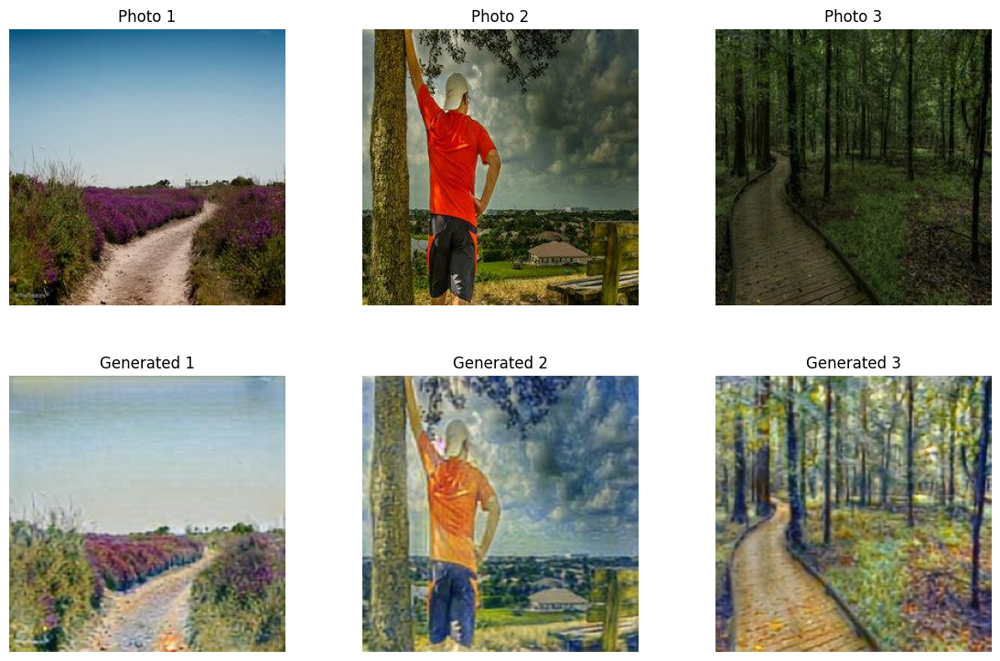

In [ ]:
filenames = [
    '0cf4dc75d0.jpg',
    '4ae0b6efb2.jpg',
    '0d7c5d97ac.jpg'
]
photo_dir= './I-m-Something-of-a-Painter-Myself/data/trainB/trainB'
generated_dir='./generated_images_model_2_seed_42/generated_images_model_2_seed_42'

show_photos_and_generated_vertical(photo_dir, generated_dir, filenames)

###### Negative performance

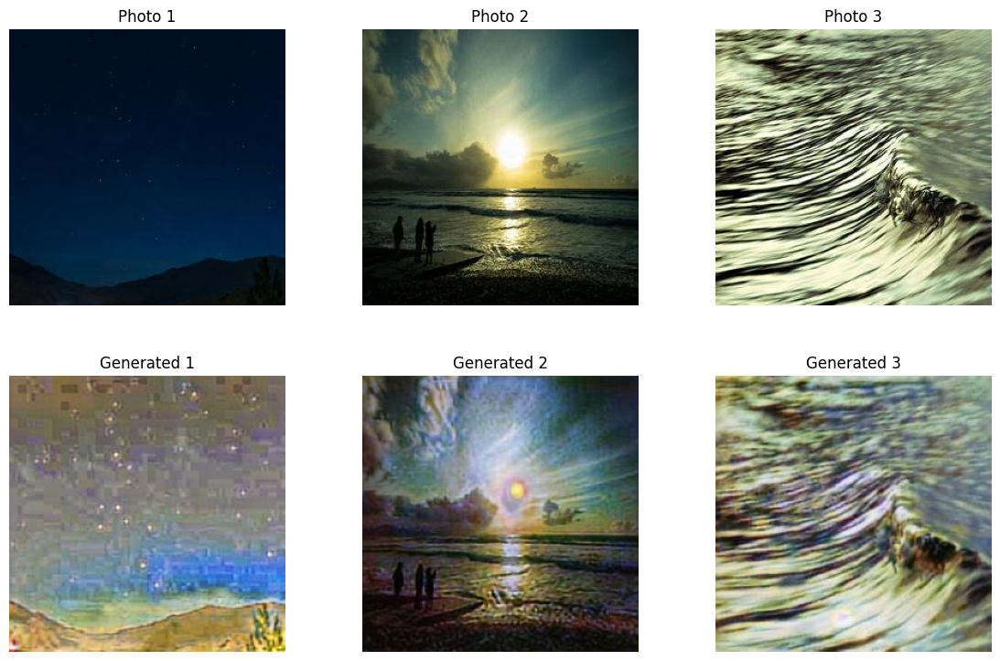

In [ ]:
filenames = [
    '0cb4144fbb.jpg',
    '000ded5c41.jpg',
    '0c64b00832.jpg'
]
photo_dir= './I-m-Something-of-a-Painter-Myself/data/trainB/trainB'
generated_dir='./generated_images_model_2_seed_42/generated_images_model_2_seed_42'

show_photos_and_generated_vertical(photo_dir, generated_dir, filenames)

# Model Comparison

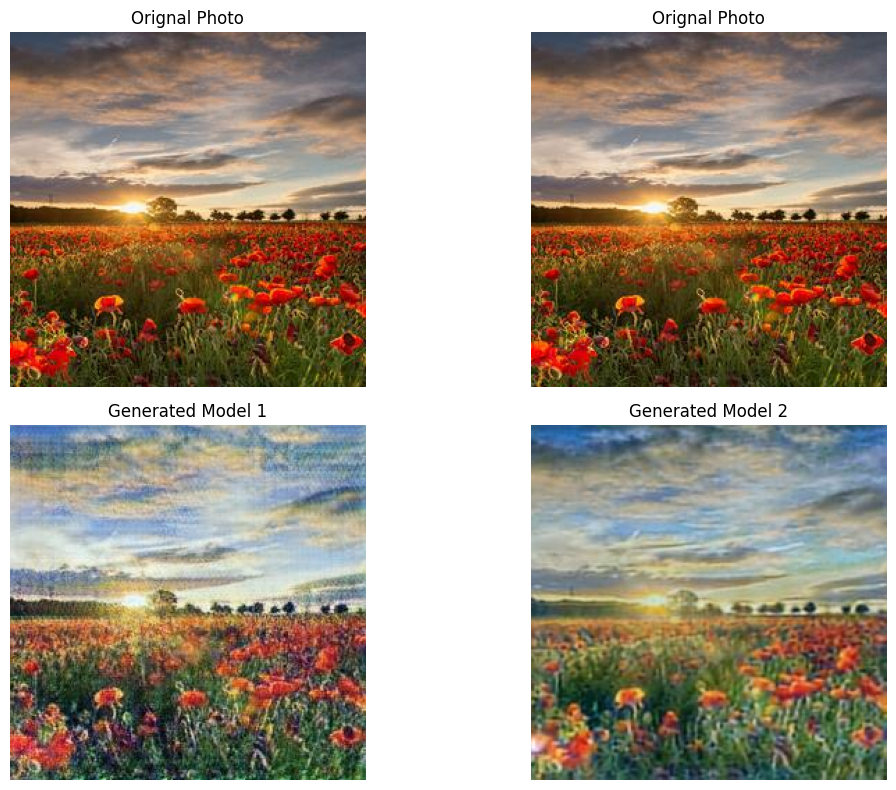

In [ ]:
show_comparison(
    photo_dir="./I-m-Something-of-a-Painter-Myself/data/trainB/trainB",
    model1_dir="./I-m-Something-of-a-Painter-Myself/output/generated_images_vanilla_model_seed_42",
    model2_dir="./I-m-Something-of-a-Painter-Myself/output/generated_images_model_2_seed_42",
    filename="2d220cb18e.jpg"
)



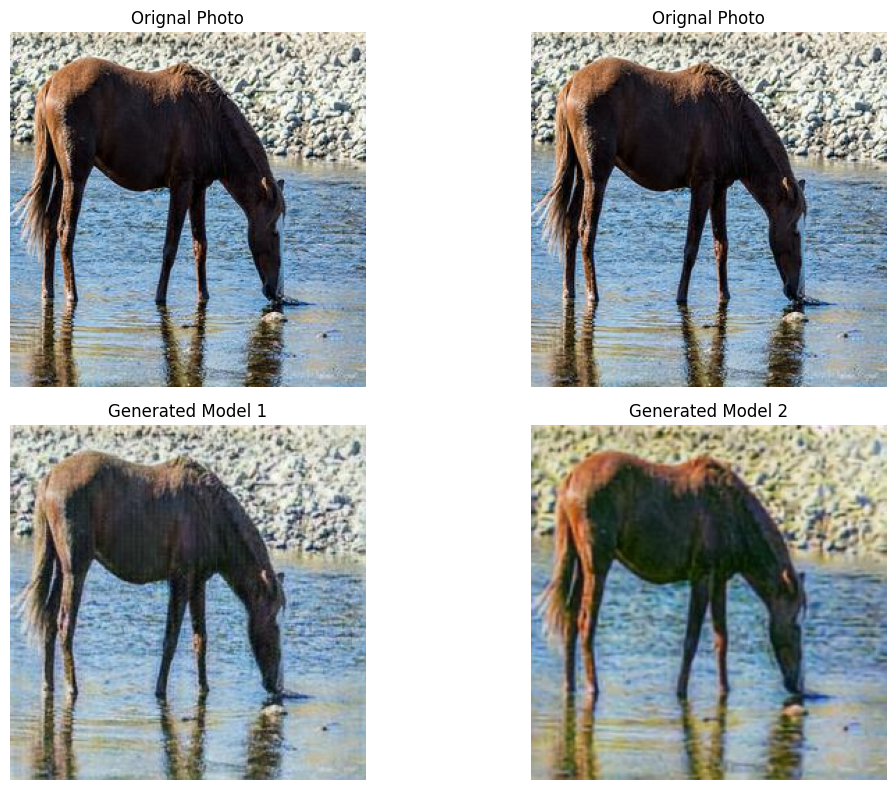

In [ ]:
show_comparison(
    photo_dir="./I-m-Something-of-a-Painter-Myself/data/trainB/trainB",
    model1_dir="./I-m-Something-of-a-Painter-Myself/output/generated_images_vanilla_model_seed_42",
    model2_dir="./I-m-Something-of-a-Painter-Myself/output/generated_images_model_2_seed_42",
    filename="0f5228f2a6.jpg"
)



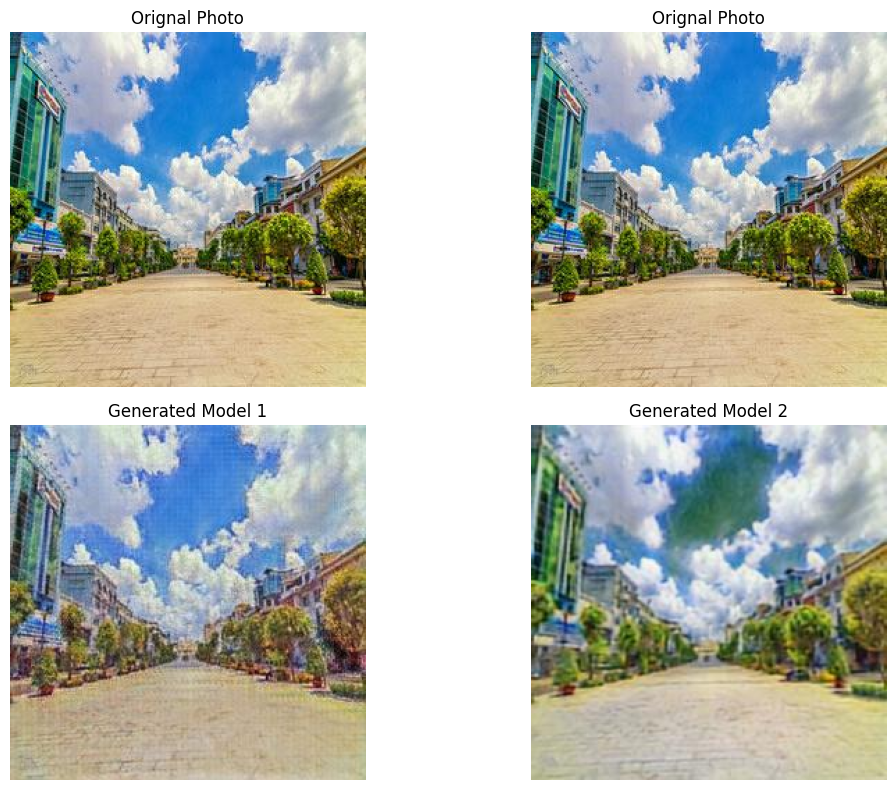

In [ ]:
show_comparison(
    photo_dir="./I-m-Something-of-a-Painter-Myself/data/trainB/trainB",
    model1_dir="./I-m-Something-of-a-Painter-Myself/output/generated_images_vanilla_model_seed_42",
    model2_dir="./I-m-Something-of-a-Painter-Myself/output/generated_images_model_2_seed_42",
    filename="1ebd894c28.jpg"

)

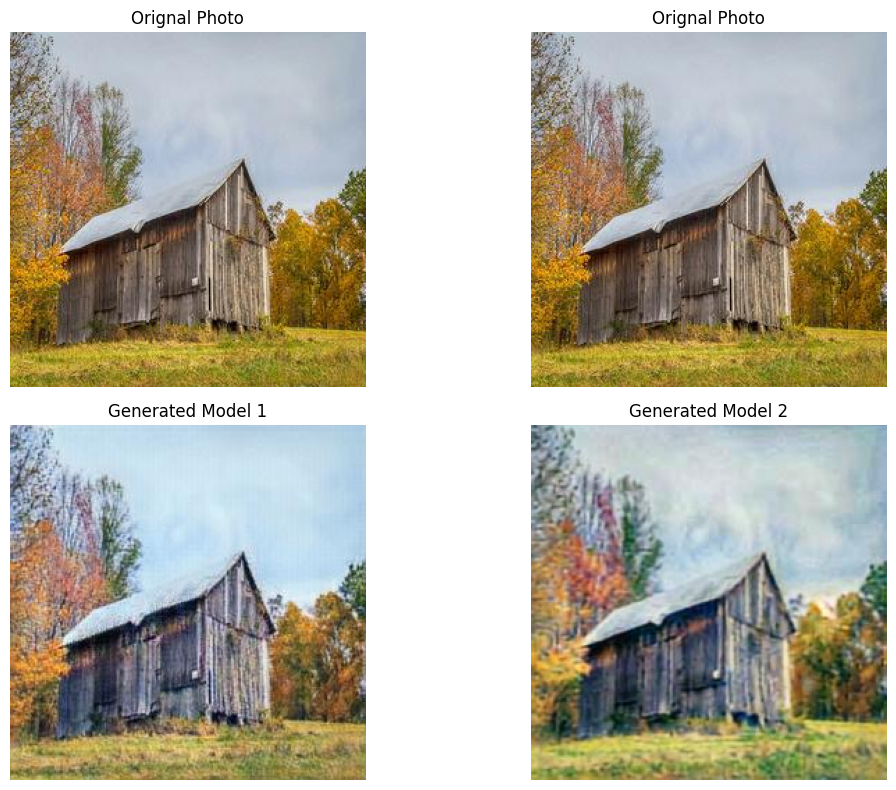

In [ ]:
show_comparison(
    photo_dir="./I-m-Something-of-a-Painter-Myself/data/trainB/trainB",
    model1_dir="./I-m-Something-of-a-Painter-Myself/output/generated_images_vanilla_model_seed_42",
    model2_dir="./I-m-Something-of-a-Painter-Myself/output/generated_images_model_2_seed_42",
    filename="0b461ab035.jpg"

)

# Effect of λ-NCE (Ablation Study)


In [ ]:
AblationOpt = Namespace(
    name='AblationModel2_lambda1',
    seed=42,
    dataroot='./I-m-Something-of-a-Painter-Myself/data',
    checkpoints_dir='./I-m-Something-of-a-Painter-Myself/checkpoints/ablation/Checkpoints_100/',

    batch_size=4,
    num_threads=4,
    max_dataset_size=float('inf'),
    train_samples=200,
    serial_batches=False,

    isTrain=True,
    phase='train',
    direction='BtoA',

    input_nc=3,
    output_nc=3,

    n_epochs=70,
    n_epochs_decay=30,
    epoch_count=1,
    lr=0.0002,
    lr_policy='linear',
    beta1=0.5,
    beta2=0.999,

    netG='resnet_15blocks',
    netD='basic',
    netF='mlp_sample',
    ngf=64,
    ndf=64,
    n_layers_D=3,
    netF_nc=256,
    init_gain=0.02,
    init_type='xavier',

    normG='instance',
    normD='instance',
    no_dropout=True,
    no_antialias=False,
    no_antialias_up=False,

    gan_mode='lsgan',
    lambda_GAN=1.0,
    lambda_NCE=1.0,
    nce_T=0.07,
    nce_layers='0,4,8,12,16',
    nce_idt=True,
    nce_includes_all_negatives_from_minibatch=False,
    num_patches = 256,
    gpu_ids=[0],

    save_epoch_freq=20,
    save_latest_freq=5000,
    save_by_iter=False,
    print_freq=100,
    verbose=False,

    preprocess = 'none',
    no_flip = False,
    flip_equivariance = False,
    continue_train = False
)


## NCELambda = 0.01

### Training Model

In [ ]:
AblationOpt.lambda_NCE = 0.01
AblationOpt.name = 'AblationModel2_lambda1'
AblationOpt.seed = 42

In [ ]:
train(AblationOpt)

dataset [UnalignedDataset] was created
The number of training images = 200
model [MinimalCUTModel] was created
----OPT----
{'batch_size': 4,
 'beta1': 0.5,
 'beta2': 0.999,
 'checkpoints_dir': './I-m-Something-of-a-Painter-Myself/checkpoints',
 'continue_train': False,
 'dataroot': './I-m-Something-of-a-Painter-Myself/data',
 'direction': 'BtoA',
 'epoch_count': 1,
 'flip_equivariance': False,
 'gan_mode': 'lsgan',
 'gpu_ids': [0],
 'init_gain': 0.02,
 'init_type': 'xavier',
 'input_nc': 3,
 'isTrain': True,
 'lambda_GAN': 1.0,
 'lambda_NCE': 0.01,
 'lr': 0.0002,
 'lr_policy': 'linear',
 'max_dataset_size': inf,
 'n_epochs': 70,
 'n_epochs_decay': 30,
 'n_layers_D': 3,
 'name': 'AblationModel2_lambda1',
 'nce_T': 0.07,
 'nce_idt': True,
 'nce_includes_all_negatives_from_minibatch': False,
 'nce_layers': '0,4,8,12,16',
 'ndf': 64,
 'netD': 'basic',
 'netF': 'mlp_sample',
 'netF_nc': 256,
 'netG': 'resnet_15blocks',
 'ngf': 64,
 'no_antialias': False,
 'no_antialias_up': False,
 'no_drop

/content/I-m-Something-of-a-Painter-Myself/code/model_2/networks.py:520: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  patch_id = torch.tensor(patch_id, dtype=torch.long, device=feat.device)


---------- Networks initialized -------------
[Network G] Total number of parameters : 18.459 M
[Network F] Total number of parameters : 0.560 M
[Network D] Total number of parameters : 2.765 M
-----------------------------------------------
Epoch 001: D=0.307  G=0.379  GAN=0.328  NCE=0.051
learning rate = 0.0002000
[Epoch 001] time=12.5s
Epoch 002: D=0.274  G=0.341  GAN=0.292  NCE=0.048
learning rate = 0.0002000
[Epoch 002] time=12.3s
Epoch 003: D=0.269  G=0.344  GAN=0.296  NCE=0.048
learning rate = 0.0002000
[Epoch 003] time=12.3s
Epoch 004: D=0.259  G=0.353  GAN=0.303  NCE=0.050
learning rate = 0.0002000
[Epoch 004] time=12.3s
Epoch 005: D=0.280  G=0.360  GAN=0.309  NCE=0.051
learning rate = 0.0002000
[Epoch 005] time=12.3s
Epoch 006: D=0.259  G=0.318  GAN=0.271  NCE=0.048
learning rate = 0.0002000
[Epoch 006] time=12.3s
Epoch 007: D=0.258  G=0.324  GAN=0.276  NCE=0.048
learning rate = 0.0002000
[Epoch 007] time=12.3s
Epoch 008: D=0.260  G=0.332  GAN=0.285  NCE=0.047
learning rate =

### Results

#### Traning Loss Convergence

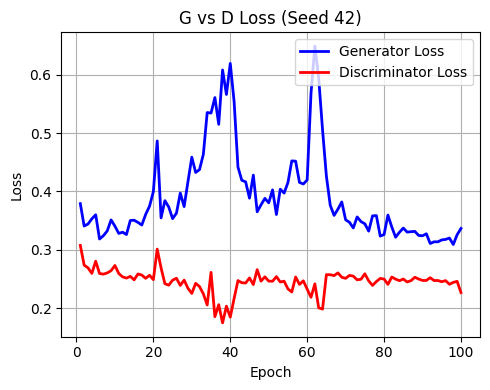

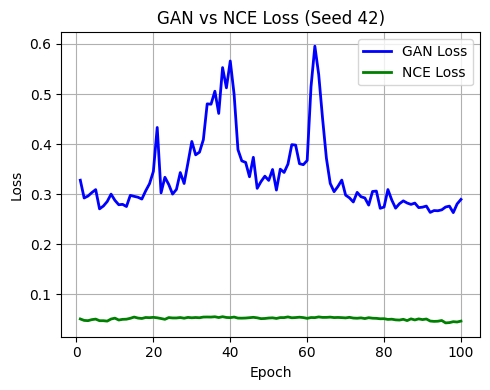

In [ ]:
json_path1 = r"./I-m-Something-of-a-Painter-Myself/checkpoints/ablation/Checkpoints_100/AblationModel2_lambda1_hist_seed_42.json"
history_Ablation_lambda1 = load_history(json_path1)

histories={"42":history_Ablation_lambda1}
plot_seeds_two_figures(histories)

#### Generated Images and Present Test Resluts

##### Generate Images

In [ ]:
from argparse import Namespace

AblatioTestOpt = Namespace(
    phase="test",
    epoch="latest",
    direction="BtoA",
    num_test=7038,
    gpu_ids=[0],
    isTrain=False,
    batch_size=1,
    num_threads=0,
    serial_batches=True,
    max_dataset_size=float("inf"),
    no_flip=True,
    input_nc=3,
    output_nc=3,
    netG="resnet_15blocks",
    ngf=64,
    normG="instance",
    init_type="xavier",
    init_gain=0.02,
    no_antialias = False,
    no_antialias_up = False,
    preprocess="none",
    verbose=False,

    nce_idt=True,
    nce_layers="0,4,8,12,16",
    netF="mlp_sample",
    netF_nc=256,
    lambda_GAN=1.0,
    lambda_NCE=1.0,
    nce_T=0.07,
    num_patches=256,
    ndf=64,
    netD="basic",
    normD="instance",
    no_dropout=True,
)

In [ ]:
AblatioTestOpt.name = 'AblationModel2_lambda1'
AblatioTestOpt.seed = 42

checkpoint_dir = r"./I-m-Something-of-a-Painter-Myself/checkpoints/ablation/Checkpoints_100/AblationModel2_lambda1/latest_net_G.pth"
net_G_42 = load_trained_generator(AblatioTestOpt, checkpoint_dir, device='cuda' if torch.cuda.is_available() else 'cpu')

generate_images(
    net_G_42,
    input_dir=r"./I-m-Something-of-a-Painter-Myself/data/trainB/trainB",
    output_dir="./I-m-Something-of-a-Painter-Myself/output/ablation/generated_images_AblationModel2_lambda1",
)

model [MinimalCUTModel] was created
netG loaded from /content/I-m-Something-of-a-Painter-Myself/checkpoints/AblationModel2_lambda1/latest_net_G.pth
CUDA Available: True
Generated images saved in ./I-m-Something-of-a-Painter-Myself/output/Ablation/generated_images_AblationModel2_lambda1


##### Test Resluts


###### Quantitative Metric- MiFID

In [ ]:
from evaluation.evaluation import calculate_kid_given_paths, distance_thresholding, model_params

user_images_path = r'./I-m-Something-of-a-Painter-Myself/output/ablation/generated_images_AblationModel2_lambda1'
real_images_path = r'./evaluation_images/monet_evaluation_jpg' # obtain github readme.

images_path = [user_images_path, real_images_path]

public_path=r"./I-m-Something-of-a-Painter-Myself/code/model_2/evaluation/classify_image_graph_def.pb"

fid_epsilon = 10e-15

fid_value_public_42, distance_public_42_true = calculate_kid_given_paths(images_path, 'Inception', public_path)
distance_public_42 = distance_thresholding(distance_public_42_true, model_params['Inception']['cosine_distance_eps'])
print("FID_public: ", fid_value_public_42, "distance_public_42: ", distance_public_42, "multiplied_public: ", fid_value_public_42 /(distance_public_42 + fid_epsilon))

100%|██████████| 893/893 [00:17<00:00, 52.38it/s]


m1,m2 shape= ((2048,), (2048,)) s1,s2= ((2048, 2048), (2048, 2048))
starting calculating FID
covmean.shape= (2048, 2048)
done with FID, starting distance calculation
d.shape= (7038, 893)
np.min(d, axis=1).shape= (7038,)
distance= 0.3536978616508496
FID_public:  293.4044528657139 distance_public_42:  1 multiplied_public:  293.40445286571094


###### Qualitative Examples

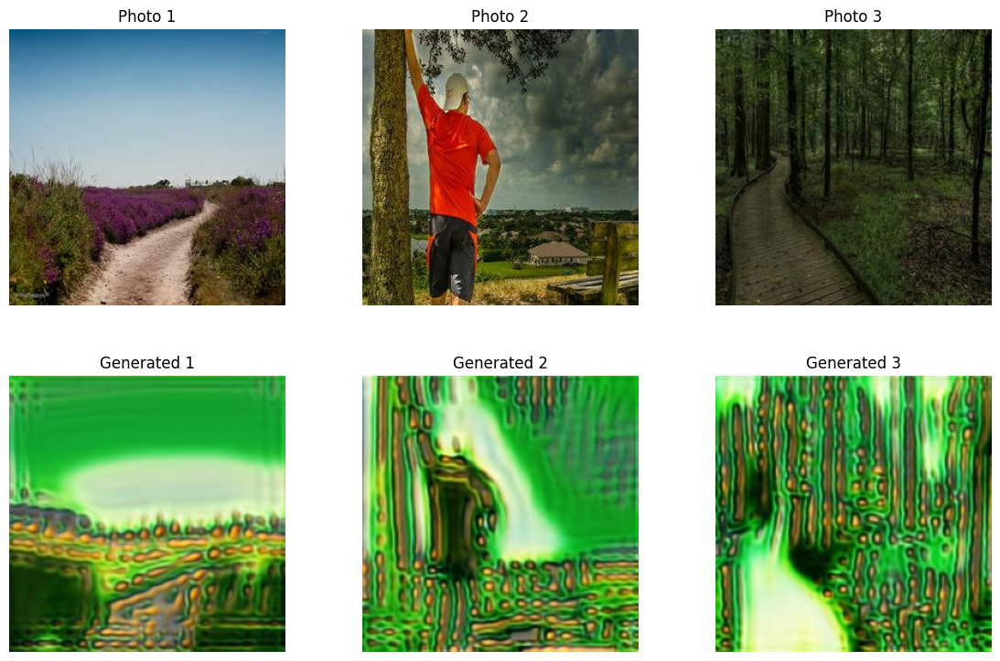

In [ ]:
filenames = [
    '0cf4dc75d0.jpg',
    '4ae0b6efb2.jpg',
    '0d7c5d97ac.jpg'
]
photo_dir= './I-m-Something-of-a-Painter-Myself/data/trainB/trainB'
generated_dir='./I-m-Something-of-a-Painter-Myself/output/ablation/generated_images_AblationModel2_lambda1'

show_photos_and_generated_vertical(photo_dir, generated_dir, filenames)

## NCELambda = 0.35

Another exampel for NCELambda = 0.35

### Training Model

In [ ]:
AblationOpt.lambda_NCE = 0.35
AblationOpt.name = 'AblationModel2_lambda2'
AblationOpt.seed = 42


In [ ]:
train(AblationOpt)

dataset [UnalignedDataset] was created
The number of training images = 200
model [MinimalCUTModel] was created
----OPT----
{'batch_size': 4,
 'beta1': 0.5,
 'beta2': 0.999,
 'checkpoints_dir': './I-m-Something-of-a-Painter-Myself/checkpoints',
 'continue_train': False,
 'dataroot': './I-m-Something-of-a-Painter-Myself/data',
 'direction': 'BtoA',
 'epoch_count': 1,
 'flip_equivariance': False,
 'gan_mode': 'lsgan',
 'gpu_ids': [0],
 'init_gain': 0.02,
 'init_type': 'xavier',
 'input_nc': 3,
 'isTrain': True,
 'lambda_GAN': 1.0,
 'lambda_NCE': 0.35,
 'lr': 0.0002,
 'lr_policy': 'linear',
 'max_dataset_size': inf,
 'n_epochs': 70,
 'n_epochs_decay': 30,
 'n_layers_D': 3,
 'name': 'AblationModel2_lambda2',
 'nce_T': 0.07,
 'nce_idt': True,
 'nce_includes_all_negatives_from_minibatch': False,
 'nce_layers': '0,4,8,12,16',
 'ndf': 64,
 'netD': 'basic',
 'netF': 'mlp_sample',
 'netF_nc': 256,
 'netG': 'resnet_15blocks',
 'ngf': 64,
 'no_antialias': False,
 'no_antialias_up': False,
 'no_drop

/content/I-m-Something-of-a-Painter-Myself/code/model_2/networks.py:520: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  patch_id = torch.tensor(patch_id, dtype=torch.long, device=feat.device)


---------- Networks initialized -------------
[Network G] Total number of parameters : 18.459 M
[Network F] Total number of parameters : 0.560 M
[Network D] Total number of parameters : 2.765 M
-----------------------------------------------
Epoch 001: D=0.295  G=1.972  GAN=0.319  NCE=1.653
learning rate = 0.0002000
[Epoch 001] time=14.9s
Epoch 002: D=0.270  G=1.806  GAN=0.289  NCE=1.517
learning rate = 0.0002000
[Epoch 002] time=12.1s
Epoch 003: D=0.290  G=1.747  GAN=0.337  NCE=1.411
learning rate = 0.0002000
[Epoch 003] time=12.1s
Epoch 004: D=0.254  G=1.587  GAN=0.277  NCE=1.309
learning rate = 0.0002000
[Epoch 004] time=12.1s
Epoch 005: D=0.252  G=1.433  GAN=0.276  NCE=1.156
learning rate = 0.0002000
[Epoch 005] time=12.1s
Epoch 006: D=0.256  G=1.416  GAN=0.295  NCE=1.121
learning rate = 0.0002000
[Epoch 006] time=12.2s
Epoch 007: D=0.256  G=1.330  GAN=0.295  NCE=1.035
learning rate = 0.0002000
[Epoch 007] time=12.1s
Epoch 008: D=0.266  G=1.304  GAN=0.315  NCE=0.989
learning rate =

### Results

#### Traning Loss Convergence

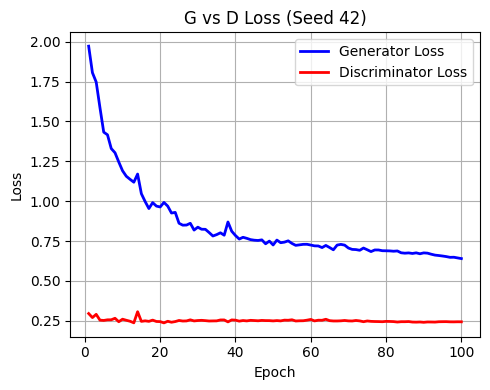

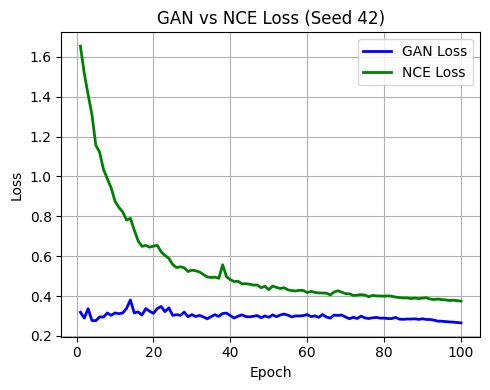

In [ ]:
json_path_2 = r"./I-m-Something-of-a-Painter-Myself/checkpoints/ablation/Checkpoints_100/AblationModel2_lambda2_hist_seed_42.json"
history_Ablation_lambda2 = load_history(json_path_2)

histories={"42":history_Ablation_lambda2}
plot_seeds_two_figures(histories)

#### Generated Images and Present Test Resluts

##### Generate Images

In [ ]:
AblatioTestOpt.name = 'AblationModel2_lambda2'
AblatioTestOpt.seed = 42
checkpoint_dir = r"./I-m-Something-of-a-Painter-Myself/checkpoints/ablation/Checkpoints_100/AblationModel2_lambda2/latest_net_G.pth"
net_G_42 = load_trained_generator(AblatioTestOpt, checkpoint_dir, device='cuda' if torch.cuda.is_available() else 'cpu')

generate_images(
    net_G_42,
    input_dir=r"./I-m-Something-of-a-Painter-Myself/data/trainB/trainB",
    output_dir="./I-m-Something-of-a-Painter-Myself/output/ablation/generated_images_AblationModel2_lambda2",
)

model [MinimalCUTModel] was created
netG loaded from ./I-m-Something-of-a-Painter-Myself/checkpoints/AblationModel2_lambda2/latest_net_G.pth
CUDA Available: True
Generated images saved in ./I-m-Something-of-a-Painter-Myself/output/Ablation/generated_images_AblationModel2_lambda2


##### Test Resluts

###### Quantitative Metric- MiFID

In [ ]:
from evaluation.evaluation import calculate_kid_given_paths, distance_thresholding, model_params

user_images_path = r'./I-m-Something-of-a-Painter-Myself/output/ablation/generated_images_AblationModel2_lambda2'
real_images_path = r'/content/evaluation_images/monet_evaluation_jpg'

images_path = [user_images_path, real_images_path]

public_path=r"./I-m-Something-of-a-Painter-Myself/code/model_2/evaluation/classify_image_graph_def.pb"

fid_epsilon = 10e-15

fid_value_public_42, distance_public_42_true = calculate_kid_given_paths(images_path, 'Inception', public_path)
distance_public_42 = distance_thresholding(distance_public_42_true, model_params['Inception']['cosine_distance_eps'])
print("FID_public: ", fid_value_public_42, "distance_public_42: ", distance_public_42, "multiplied_public: ", fid_value_public_42 /(distance_public_42 + fid_epsilon))

Instructions for updating:
non-resource variables are not supported in the long term
Instructions for updating:
Use tf.gfile.GFile.
100%|██████████| 893/893 [00:16<00:00, 54.56it/s]


m1,m2 shape= ((2048,), (2048,)) s1,s2= ((2048, 2048), (2048, 2048))
starting calculating FID
covmean.shape= (2048, 2048)
done with FID, starting distance calculation
d.shape= (7038, 893)
np.min(d, axis=1).shape= (7038,)
distance= 0.2570506278375544
FID_public:  80.27212289306846 distance_public_42:  1 multiplied_public:  80.27212289306766


###### Qualitative Examples

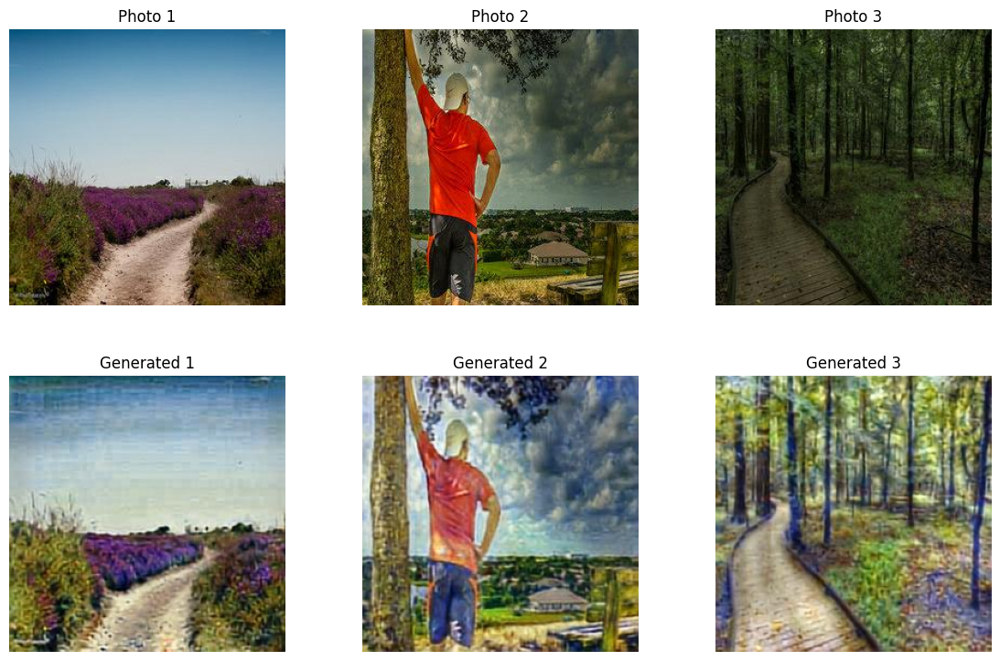

In [ ]:
filenames = [
    '0cf4dc75d0.jpg',
    '4ae0b6efb2.jpg',
    '0d7c5d97ac.jpg'
]
photo_dir= './I-m-Something-of-a-Painter-Myself/data/trainB/trainB'
generated_dir='./I-m-Something-of-a-Painter-Myself/output/ablation/generated_images_AblationModel2_lambda2'

show_photos_and_generated_vertical(photo_dir, generated_dir, filenames)